# ModelCheckpoint와 EarlyStopping 콜백

In [ ]:
import keras

callbacks_list = [
                  keras.callbacks.EarlyStopping(
                      monitor='val_acc',
                      patience=1,
                  ),
                  keras.callbacks.ModelCheckpoint(
                      filepath='my_model.h5',
                      monitor='val_loss',
                      save_best_only=True,
                  )
]

model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['acc'])

model.fit(x,y,
          epochs=10,
          batch_size=32,
          callbacks=callbacks_list,
          validation_data=(x_val, y_val))

# ReduceLROnPlateau 콜백

In [ ]:
import keras

callbacks_list=[
                keras.callbacks.ReduceLROnPlateau(
                    monitor='val_loss',
                    factor=0.1,
                    patience=10,
                )
]

model.fit(x,y,
          epochs=10,
          batch_size=32,
          callbacks=callbacks_list,
          validation_data=(x_val, y_val))

# 자신만의 콜백 만들기

In [10]:
import keras
import numpy as np

class ActivationLogger(keras.callbacks.Callback):

    def set_model(self, model):
        self.model = model
        layer_output = [layer.output for layer in model.layers]
        self.activations_model = keras.models.Model(model.input,
                                                    layer_outputs)
        
    def on_epoch_end(self, epoch, logs=None):
        if self.validation_data is None:
            raise RuntimeError('Requires validation_data.')

        validation_sample = self.validation_data[0][0:1]
        activations = self.activations_model.predict(validation_sample)
        f = open('activations_at_epoch_' + str(epoch) + '.npz', 'wb')
        np.savez(f, activations)
        f.close()

# 텐서보드

In [1]:
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.datasets import imdb
from tensorflow.keras.preprocessing import sequence

max_features = 2000
max_len = 500

print('데이터 로드...')
(x_train, y_train), (x_test, y_test) = imdb.load_data(num_words = max_features)
print(len(x_train), '훈련 시퀀스')
print(len(x_test), '테스트 시퀀스')

print('시퀀스 패딩 (samples x time)')
x_train = sequence.pad_sequences(x_train, maxlen=max_len)
x_test = sequence.pad_sequences(x_test, maxlen=max_len)
print('x_train 크기:', x_train.shape)
print('x_test 크기:', x_test.shape)


model = keras.models.Sequential()
model.add(layers.Embedding(max_features, 128, input_length=max_len, name='embed'))
model.add(layers.Conv1D(32, 7, activation='relu'))
model.add(layers.MaxPooling1D(5))
model.add(layers.Conv1D(32, 7, activation='relu'))
model.add(layers.GlobalMaxPooling1D())
model.add(layers.Dense(1))
model.summary()
model.compile(optimizer='rmsprop',
              loss='binary_crossentropy',
              metrics=['acc'])


데이터 로드...
17473536/17464789 [==============================] - 0s 0us/step
25000 훈련 시퀀스
25000 테스트 시퀀스
시퀀스 패딩 (samples x time)
x_train 크기: (25000, 500)
x_test 크기: (25000, 500)
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embed (Embedding)           (None, 500, 128)          256000    
                                                                 
 conv1d (Conv1D)             (None, 494, 32)           28704     
                                                                 
 max_pooling1d (MaxPooling1D  (None, 98, 32)           0         
 )                                                               
                                                                 
 conv1d_1 (Conv1D)           (None, 92, 32)            7200      
                                                                 
 global_max_pooling1d (Globa  (None, 32)               0         
 lMaxPooling1

In [2]:
!mkdir my_log_dir

In [3]:
callbacks = [
             keras.callbacks.TensorBoard(
                 log_dir='my_log_dir',
                 histogram_freq=1,
                 embeddings_freq=1,
             )
]
history = model.fit(x_train, y_train,
                    epochs=20,
                    batch_size=128,
                    validation_split=0.2,
                    callbacks=callbacks)

Epoch 1/20
157/157 [==============================] - 35s 25ms/step - loss: 0.6207 - acc: 0.6701 - val_loss: 0.4106 - val_acc: 0.8402
Epoch 2/20
157/157 [==============================] - 3s 22ms/step - loss: 0.4491 - acc: 0.8569 - val_loss: 0.4714 - val_acc: 0.8608
Epoch 3/20
157/157 [==============================] - 3s 21ms/step - loss: 0.3859 - acc: 0.8839 - val_loss: 0.4615 - val_acc: 0.8708
Epoch 4/20
157/157 [==============================] - 3s 22ms/step - loss: 0.3493 - acc: 0.9014 - val_loss: 0.5582 - val_acc: 0.8666
Epoch 5/20
157/157 [==============================] - 3s 22ms/step - loss: 0.3113 - acc: 0.9179 - val_loss: 0.5493 - val_acc: 0.8714
Epoch 6/20
157/157 [==============================] - 3s 22ms/step - loss: 0.2684 - acc: 0.9341 - val_loss: 0.5442 - val_acc: 0.8698
Epoch 7/20
157/157 [==============================] - 3s 22ms/step - loss: 0.2244 - acc: 0.9518 - val_loss: 0.7494 - val_acc: 0.8616
Epoch 8/20
157/157 [==============================] - 3s 22ms/step -

In [4]:
!tensorboard --logdir=my_log_dir


NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

Serving TensorBoard on localhost; to expose to the network, use a proxy or pass --bind_all
TensorBoard 2.7.0 at http://localhost:6006/ (Press CTRL+C to quit)


In [6]:
%load_ext tensorboard
%tensorboard --logdir /content/my_log_dir

Output hidden; open in https://colab.research.google.com to view.

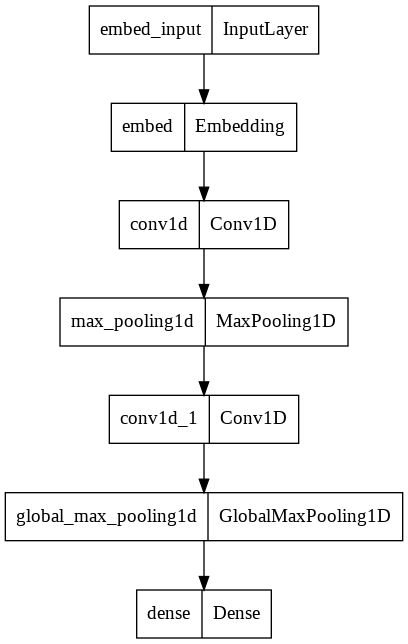

In [8]:
from tensorflow.keras.utils import plot_model

plot_model(model, to_file='model.png')

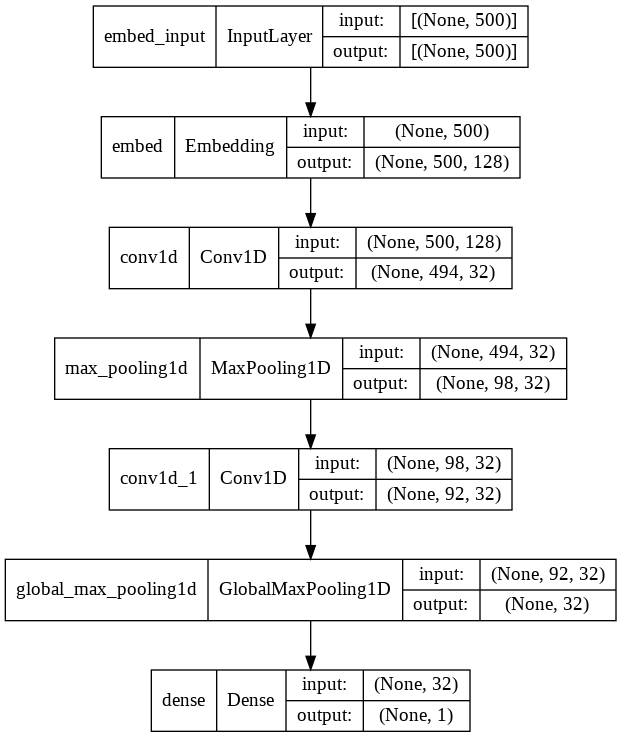

In [14]:
from tensorflow.keras.utils import plot_model

plot_model(model, show_shapes=True, show_layer_names=True,rankdir='TB', to_file='model.png')